# T31 — Dynamic topography change in deep time


**Cluster E: Mantle dynamics + dynamic topography.**
**Compute the change in mantle-driven dynamic topography over a 20-Myr interval at ten snapshot ages spanning 900 → 0 Ma, using Young et al. (2022) plate-frame dyntopo grids and the **M21 NNR** plate model — Merdith et al. (2021) in a no-net-rotation reference frame, which is the frame Young et al. ran their geodynamic simulation in.** Where the surface is being uplifted by mantle flow over the preceding 20 Myr the field reads positive (red); where it is subsiding the field reads negative (blue).

## What this notebook produces

Ten paleogeographic Mollweide maps, one per snapshot age in `SNAPSHOT_AGES` (default: 900, 800, 700, 600, 500, 400, 300, 200, 100, 0 Ma). Each map shows the per-step dyntopo change

> Δz(t) = dyntopo(t) − dyntopo(t + 20)

computed in **plate reference frame** from the Young et al. (2022) `gld428` plate-frame grids, then cookie-cut + rotated into the M21 NNR frame at t via `gplately.Raster.reconstruct()`. The plate-frame Δz is in metres over the 20 Myr interval; the colorbar shows the **rate** Δz / 20 Myr in **m/Myr** for ease of comparison across panels. Reconstructed continental outlines and the topological plate-boundary network — including triangular subduction teeth on the downgoing side — are overlaid on top.

## Why plate frame for the difference?

In a mantle reference frame the continents move past each fixed lat/lon cell, so `dyntopo(t) − dyntopo(t+20)` at the same cell compares dyntopo under *different* parts of *different* continents 20 Myr apart — physically meaningless. In plate reference frame each grid cell is rigidly attached to its continental block, so the subtraction gives the true time-change of dyntopo at that point on that continent. We then cookie-cut the plate-frame Δz by the M21 NNR continental polygons and rotate it to those continents' positions at age t, so the per-step dyntopo change reads on top of continents *where they were* at age t in the no-net-rotation reference frame the simulation was run in.

## Why the M21 NNR plate model (and not Müller 2022)

Young et al. (2022) ran their geodynamic simulation in a **no-net-rotation (NNR) reference frame applied to the Merdith et al. (2021) plate model** — usually abbreviated **M21 NNR**. The Müller et al. (2022) mantle-frame plate model is *close* to M21 NNR for the last \~100 Myr but diverges by tens to hundreds of kilometres further back in time (it is built from a "tectonic-rules" mantle referance frame adjustment, not a strict NNR). The same plate model that drove the simulation must therefore drive (a) the cookie-cutting of plate-frame Δz and (b) the rotation of Δz to the snapshot age — otherwise the dyntopo field gets shifted off the continents it was simulated on. The M21 NNR rotation files are not in the Plate Model Manager, so they are bundled with the repo under `data/Young2022_dynamic_topo/plate_model/` and loaded directly with pygplates.

## Plate-frame grid + rotation provenance

The `gld428` plate-frame dynamic-topography grids and the M21 NNR rotation files were obtained from EarthByte's public dyntopo dataset for Young et al. (2022):

> <https://www.earthbyte.org/webdav/ftp/Dynamic_Topography/gld428_m21/>

The 20 grids needed for the 10 snapshot ages are bundled under `data/Young2022_dynamic_topo/plate_frame/20my_0-960Ma/`; the full M21 NNR plate-model files (rotation + topology + continental polygons) are bundled under `data/Young2022_dynamic_topo/plate_model/`.

**Audience:** postgrad.   **Difficulty:** ★★★.

## Learning objectives

- Compute a per-step plate-frame difference of two paleo-rasters and explain why subtracting them in the mantle frame would be wrong.
- Use `gplately.Raster.reconstruct()` to cookie-cut a present-day plate-frame field and rotate it to a paleogeographic reconstruction in the same reference frame the simulation ran in.
- Overlay topological plate boundaries with triangular subduction teeth on a paleogeographic map for clear tectonic context.

## Prerequisites and runtime

- Plate model: M21 NNR — Merdith 2021 in no-net-rotation frame. Rotation + topology + continental-polygons files bundled under `data/Young2022_dynamic_topo/plate_model/` (not in PMM).
- Bundled data: 20 Young 2022 `gld428` plate-frame dyntopo grids (one at each of the 10 snapshot ages plus one at age + 20 Myr each, ≈16 MB per grid, ≈320 MB total) under `data/Young2022_dynamic_topo/plate_frame/20my_0-960Ma/`.
- Python: `gplately`, `pygmt`, `pygplates`, `numpy`, `xarray`.
- Runtime: ≈30 s per snapshot × 10 snapshots ≈ 5 min total (most of the cost is `gplately.Raster.reconstruct`).

## Data citation

Young, A., Flament, N., Williams, S.E., Merdith, A., Cao, X. and Müller, R.D. (2022). Long-term Phanerozoic sea level change from solid Earth processes. *Earth and Planetary Science Letters* 584, 117451. https://doi.org/10.1016/j.epsl.2022.117451

The plate-frame `gld428` dyntopo grids and the matching M21 NNR plate-model files are from <https://www.earthbyte.org/webdav/ftp/Dynamic_Topography/gld428_m21/>.


## Configuration

In [ ]:
# Defensive cwd fix — when Jupyter launches from Notebooks/, hop up so the
# bundled data/Young2022_dynamic_topo/ paths resolve.
import os as _os
from pathlib import Path as _Path
if _Path("../data").exists() and not _Path("data").exists():
    _os.chdir("..")

# === USER CONFIGURATION =====================================================
# Plate model: M21 NNR — Merdith 2021 in no-net-rotation frame, which is
# the frame Young et al. (2022) ran their geodynamic simulation in. The
# rotation + topology files are bundled with this notebook (not on PMM).
MODEL_LABEL      = "M21 NNR (Young 2022 frame)"
ANCHOR_PLATE_ID  = 0
# Ten snapshot ages — every 100 Myr from 900 Ma to present.
SNAPSHOT_AGES    = (900, 800, 700, 600, 500, 400, 300, 200, 100, 0)
# 20-Myr step for the dyntopo difference (matches the bundled grid cadence).
STEP_MYR         = 20
# Bundled dyntopo grids + M21 NNR plate-model files.
_ZENODO_YOUNG2022_DIR = _Path(_os.environ.get("ZENODO_YOUNG2022_DIR", "zenodo_data/dynamic_topography_Young2022"))
DYNTOPO_DIR      = str(_ZENODO_YOUNG2022_DIR / "plate_frame/20my_0-960Ma")
M21NNR_DIR       = str(_ZENODO_YOUNG2022_DIR / "plate_model")
# pyGMT cpt range for the dyntopo CHANGE RATE in m/Myr (divergent around 0).
# ±50 m/Myr corresponds to ±1000 m over the 20 Myr interval.
DZ_RANGE_M_PER_MYR = (-50, 50, 2)
# Projection + region for the world maps.
PROJECTION       = "W0/22c"
REGION           = "d"
# ============================================================================


## 1. Imports + M21 NNR plate model

In [2]:
import os
from glob import glob
import numpy as np
import xarray as xr
import gplately, pygmt, pygplates
from IPython.display import display, HTML

print(f"gplately {gplately.__version__}  pygmt {pygmt.__version__}  pygplates {pygplates.__version__}")

# Build the M21 NNR plate model from the bundled local files (not PMM).
# rotation_model: all .rot files in M21NNR_DIR combined.
# topology_features: all .gpml files in M21NNR_DIR except the present-day
#                    continent + craton shapes (those are partitioning
#                    polygons, not dynamic plate-boundary topologies).
# static_polygons: shapes_continents_Merdith_et_al.gpml — used by
#                  gplately.Raster.reconstruct() to partition the
#                  plate-frame field into per-plate blocks.
_rot_files  = sorted(glob(os.path.join(M21NNR_DIR, "*.rot")))
_all_gpml   = sorted(glob(os.path.join(M21NNR_DIR, "*.gpml")))
_topo_files = [f for f in _all_gpml
               if "shapes_continents" not in os.path.basename(f)
               and "shapes_cratons"     not in os.path.basename(f)]
_continents_file = os.path.join(M21NNR_DIR, "shapes_continents_Merdith_et_al.gpml")
assert _rot_files,  f"no .rot files in {M21NNR_DIR}"
assert _topo_files, f"no topology .gpml files in {M21NNR_DIR}"
assert os.path.exists(_continents_file), f"missing {_continents_file}"

rotation_model    = pygplates.RotationModel(_rot_files)
topology_features = [pygplates.FeatureCollection(f) for f in _topo_files]
continents_fc     = pygplates.FeatureCollection(_continents_file)

recon = gplately.PlateReconstruction(
    rotation_model=rotation_model,
    topology_features=topology_features,
    static_polygons=continents_fc,
    anchor_plate_id=ANCHOR_PLATE_ID,
)
print(f"  M21 NNR plate model loaded  ·  anchor plate {ANCHOR_PLATE_ID}")
print(f"    {len(_rot_files)} rotation file(s), {len(_topo_files)} topology file(s)")

gplately 2.0.0.post19+git.2cce7bb3  pygmt v0.18.0  pygplates 1.0.0
  M21 NNR plate model loaded  ·  anchor plate 0
    4 rotation file(s), 7 topology file(s)


## 2. Load Young 2022 plate-frame grids + compute Δz per snapshot

For each snapshot age `t`, we need `dyntopo(t)` and `dyntopo(t + STEP_MYR)`. The Δz field

> Δz(t) = dyntopo(t) − dyntopo(t + 20)  

reads positive where surface elevation due to mantle flow was *higher at t* than 20 Myr earlier — i.e. net dyntopo-driven uplift over the 20 Myr interval ending at age t. Computed in **plate reference frame** so each lat/lon cell stays glued to the same continental block across the subtraction.

In [3]:
def load_dyntopo(age_ma):
    """Load Young 2022 plate-frame dyntopo grid for an exact 20-Myr keyframe."""
    fp = _Path(DYNTOPO_DIR) / f"gld428_PlateFrameGrid{int(age_ma)}.nc"
    if not fp.exists():
        raise FileNotFoundError(f"Young 2022 grid not bundled at {fp}")
    da = xr.open_dataset(fp)["z"]
    # Normalise: ensure ascending lat, lon in [-180, +180]
    if da["lat"].values[0] > da["lat"].values[-1]:
        da = da.isel(lat=slice(None, None, -1))
    if float(da["lon"].max()) > 180:
        da = da.assign_coords(lon=(((da["lon"] + 180) % 360) - 180)).sortby("lon")
    return da

def plate_frame_dz(age_ma, step_myr=STEP_MYR):
    """Δz(t) = dyntopo(t) − dyntopo(t + step_myr), in plate frame."""
    dyntopo_t       = load_dyntopo(age_ma)
    dyntopo_t_plus  = load_dyntopo(age_ma + step_myr)
    dz = dyntopo_t - dyntopo_t_plus
    dz.name = "z"
    return dz

## 3. Rotate plate-frame Δz into the M21 NNR paleogeographic reconstruction at age t

`gplately.Raster` wraps a global raster + a `PlateReconstruction`; calling `.reconstruct(time=t)` partitions the raster by the static polygons attached to the reconstruction and rotates each plate's portion to its position at age `t`. We use it here to cookie-cut the plate-frame Δz by the M21 NNR continental polygons and rotate it to where those continents were at the snapshot age in the no-net-rotation reference frame.


In [4]:
def rotate_plate_frame_to_paleomag(dz_plate, age_ma):
    """Cookie-cut a plate-frame Δz field by Muller 2022 static polygons and
    rotate it to its paleomag-frame paleo-position at age_ma."""
    lat = dz_plate["lat"].values
    lon = dz_plate["lon"].values
    raster = gplately.Raster(
        data=dz_plate.values.astype(np.float32),
        plate_reconstruction=recon,
        time=0,        # plate-frame field = present-day positions of continents
        extent=[float(lon.min()), float(lon.max()),
                float(lat.min()), float(lat.max())],
    )
    rec = raster.reconstruct(
        time=float(age_ma),
        threads=1,
        anchor_plate_id=ANCHOR_PLATE_ID,
        inplace=False,
    )
    arr = np.asarray(rec.data if rec is not None else raster.data)
    out = xr.DataArray(arr, dims=("lat", "lon"),
                       coords={"lat": lat, "lon": lon}, name="z")
    return out

## 4. Render one snapshot

For each age `t`, paint the rotated Δz/Δt raster (divergent polar palette around 0, in m/Myr) on a Mollweide world, overlay reconstructed continental outlines from M21 NNR, then the topological plate-boundary network, then the subducting trenches with triangular teeth pointing in the dip direction.

In [5]:
def render_snapshot(age_ma):
    print(f"  {int(age_ma)} Ma: computing Δz = dyntopo({int(age_ma)}) − dyntopo({int(age_ma)+STEP_MYR}) ...")
    dz_plate = plate_frame_dz(age_ma)
    print(f"    plate-frame Δz range: [{float(dz_plate.min()):+.0f}, {float(dz_plate.max()):+.0f}] m")
    dz_paleo = rotate_plate_frame_to_paleomag(dz_plate, age_ma)
    # Convert from "m over the STEP_MYR interval" to a rate in m/Myr
    dz_paleo = dz_paleo / float(STEP_MYR)
    print(f"    rotated Δz/Δt range:  [{float(np.nanmin(dz_paleo.values)):+.1f}, "
          f"{float(np.nanmax(dz_paleo.values)):+.1f}] m/Myr")

    # PlotTopologies for the overlays at the snapshot age. The local M21 NNR
    # bundle ships continents but not separate coastlines or COBs — pass
    # continents in the continents slot and None for the other two; the
    # ContinentalPolygons outline serves as the coastline.
    gplot = gplately.PlotTopologies(
        plate_reconstruction=recon,
        coastlines=None,
        continents=continents_fc,
        COBs=None,
        time=float(age_ma),
        plot_engine=gplately.PygmtPlotEngine(),
    )

    fig = pygmt.Figure()
    fig.basemap(region=REGION, projection=PROJECTION, frame=["af"])

    # Δz raster (polar palette diverging around 0)
    pygmt.makecpt(cmap="polar", series=list(DZ_RANGE_M_PER_MYR),
                  continuous=True, background="o")
    # Set gmt registration on the rotated DA so grdimage treats it as geographic
    dz_paleo.gmt.registration = 0
    dz_paleo.gmt.gtype = 1
    fig.grdimage(grid=dz_paleo, cmap=True, nan_transparent=True)

    # Continental outlines (no fill — keep Δz visible underneath)
    try:
        fig.plot(data=gplot.get_continents(), pen="0.35p,gray30")
    except Exception:
        pass

    # Topological plate-boundary backbone in grey, then styled overlays
    try:
        gplot.plot_all_topological_sections(fig, pen="0.4p,gray40")
    except Exception:
        pass
    try:
        gplot.plot_ridges(fig, pen="0.5p,red")
    except Exception:
        pass
    try:
        gplot.plot_transforms(fig, pen="0.4p,goldenrod")
    except Exception:
        pass
    # Trenches with triangular subduction teeth on the downgoing side
    try:
        gplot.plot_subduction_teeth(fig, color="black")
    except Exception:
        pass

    # Colorbar (m / 20 Myr)
    fig.colorbar(
        frame=f"a25f5+lDynamic topography change rate (m/Myr, computed from {STEP_MYR}-Myr difference)",
        position="JBC+w14c/0.35c+h+o0/1.4c",
    )

    # In-frame time stamp
    fig.text(text=f"{int(age_ma)} Ma  ({MODEL_LABEL})",
             position="TL", offset="0.25c/-0.25c", justify="TL",
             font="14p,Helvetica-Bold,black",
             fill="white", pen="0.6p,gray40")
    fig.show(width=1100)
    display(HTML('<div style="height:1cm"></div>'))
    return fig

## 5. Ten snapshot maps — 900 Ma to present, every 100 Myr

  900 Ma: computing Δz = dyntopo(900) − dyntopo(920) ...
    plate-frame Δz range: [-4500, +4408] m
    rotated Δz/Δt range:  [-149.8, +171.2] m/Myr


  800 Ma: computing Δz = dyntopo(800) − dyntopo(820) ...
    plate-frame Δz range: [-5566, +5577] m
    rotated Δz/Δt range:  [-169.7, +235.2] m/Myr


  700 Ma: computing Δz = dyntopo(700) − dyntopo(720) ...
    plate-frame Δz range: [-3529, +6095] m
    rotated Δz/Δt range:  [-170.2, +301.9] m/Myr


  600 Ma: computing Δz = dyntopo(600) − dyntopo(620) ...
    plate-frame Δz range: [-7105, +8075] m
    rotated Δz/Δt range:  [-330.8, +403.8] m/Myr


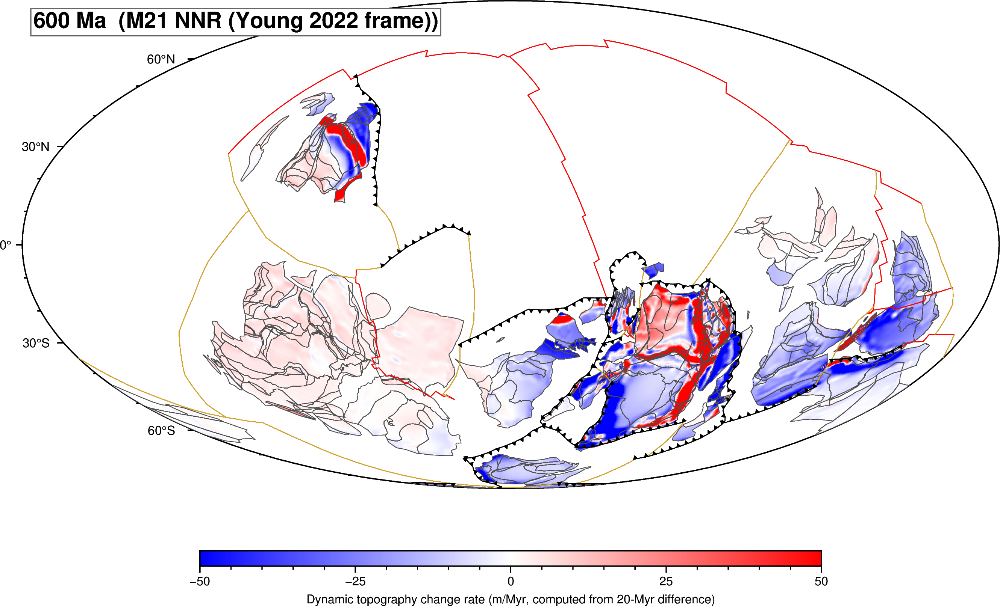

  500 Ma: computing Δz = dyntopo(500) − dyntopo(520) ...
    plate-frame Δz range: [-4582, +5581] m
    rotated Δz/Δt range:  [-229.1, +279.1] m/Myr


  400 Ma: computing Δz = dyntopo(400) − dyntopo(420) ...
    plate-frame Δz range: [-5274, +7676] m
    rotated Δz/Δt range:  [-191.0, +380.2] m/Myr


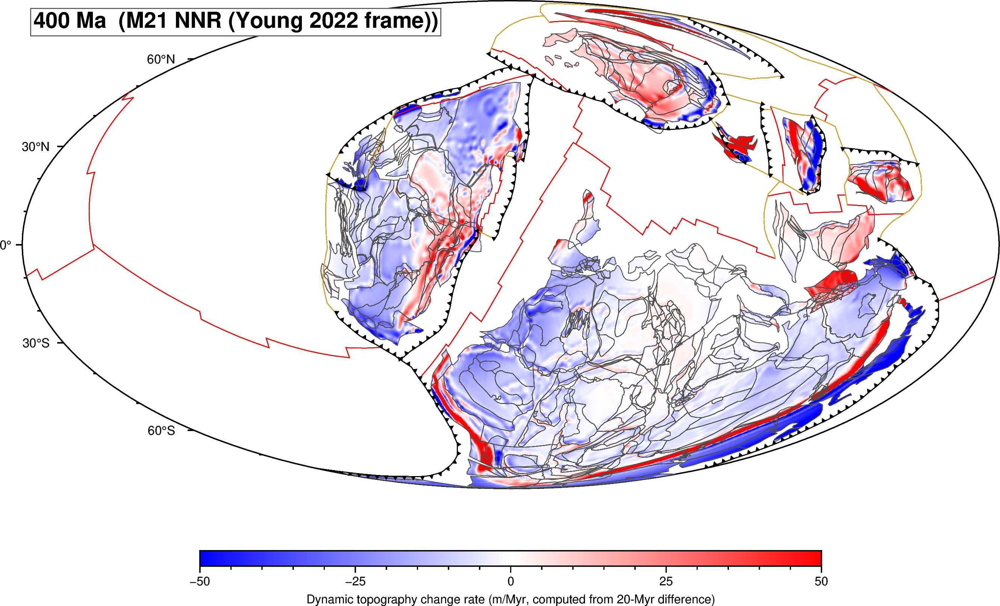

  300 Ma: computing Δz = dyntopo(300) − dyntopo(320) ...
    plate-frame Δz range: [-7078, +5717] m
    rotated Δz/Δt range:  [-353.9, +285.9] m/Myr


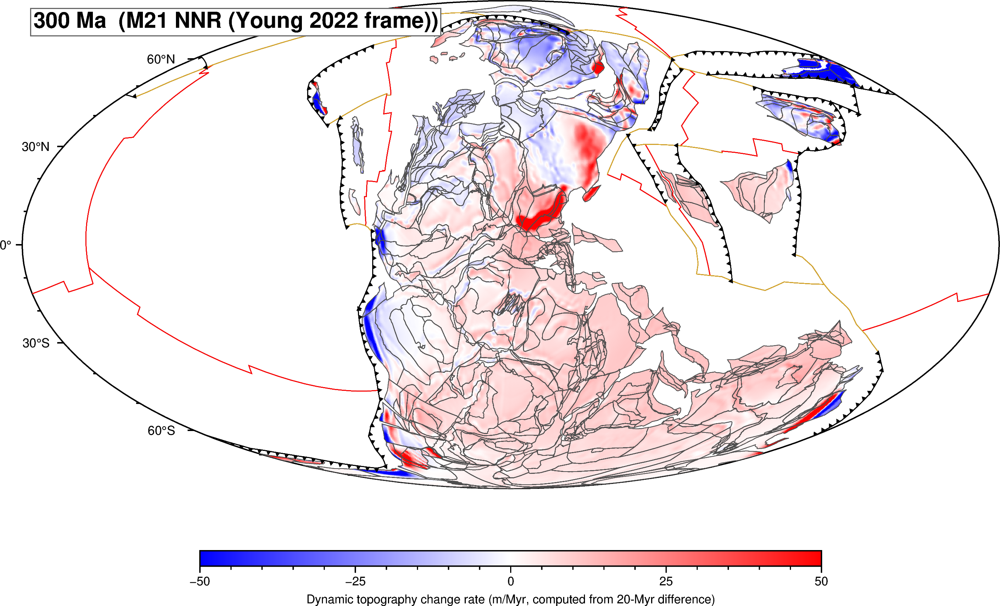

  200 Ma: computing Δz = dyntopo(200) − dyntopo(220) ...
    plate-frame Δz range: [-4448, +5287] m
    rotated Δz/Δt range:  [-168.7, +264.4] m/Myr


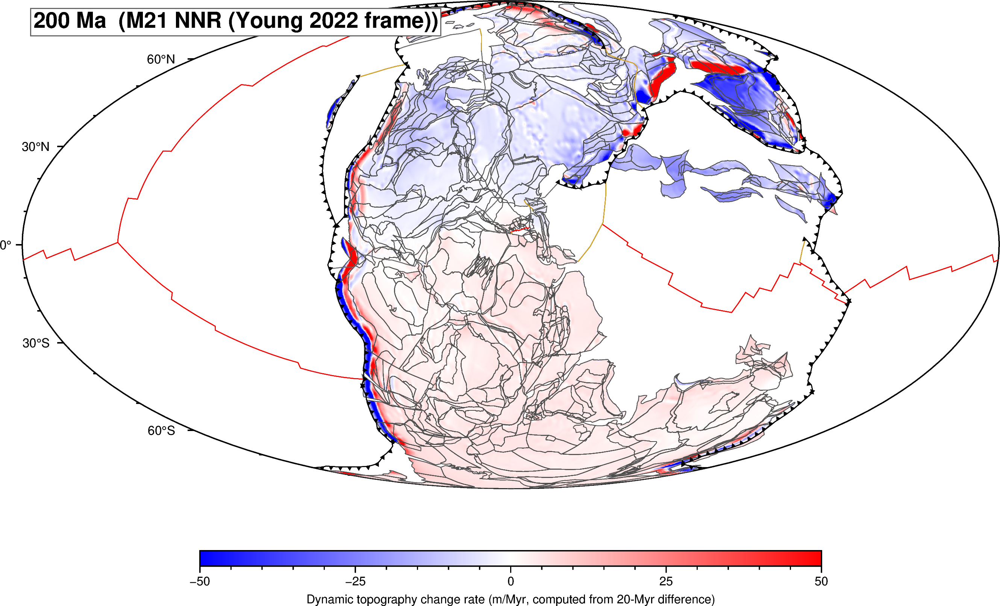

  100 Ma: computing Δz = dyntopo(100) − dyntopo(120) ...
    plate-frame Δz range: [-5674, +4957] m
    rotated Δz/Δt range:  [-283.7, +247.8] m/Myr


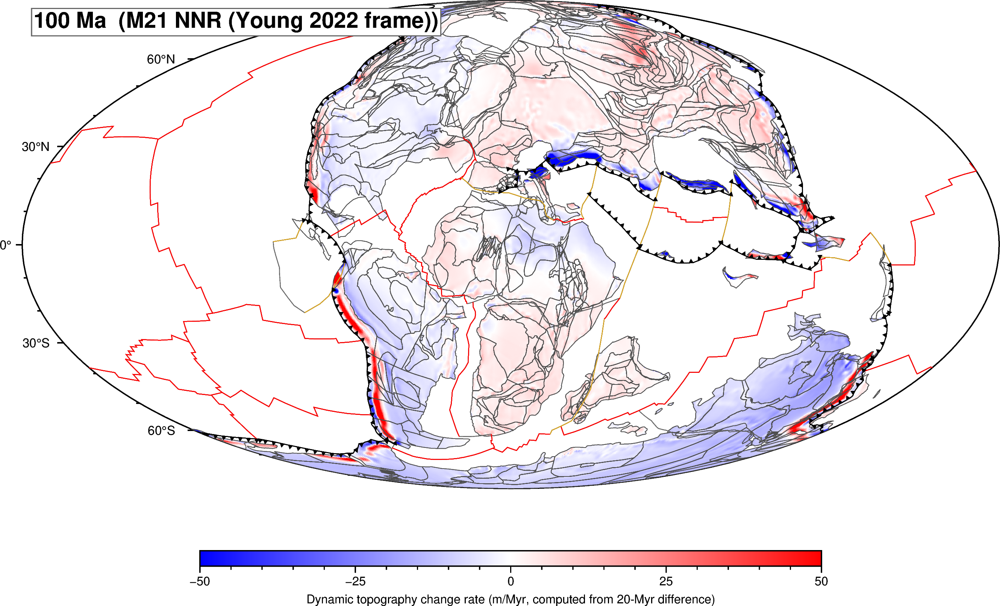

  0 Ma: computing Δz = dyntopo(0) − dyntopo(20) ...
    plate-frame Δz range: [-5786, +6366] m
    rotated Δz/Δt range:  [-289.3, +318.3] m/Myr


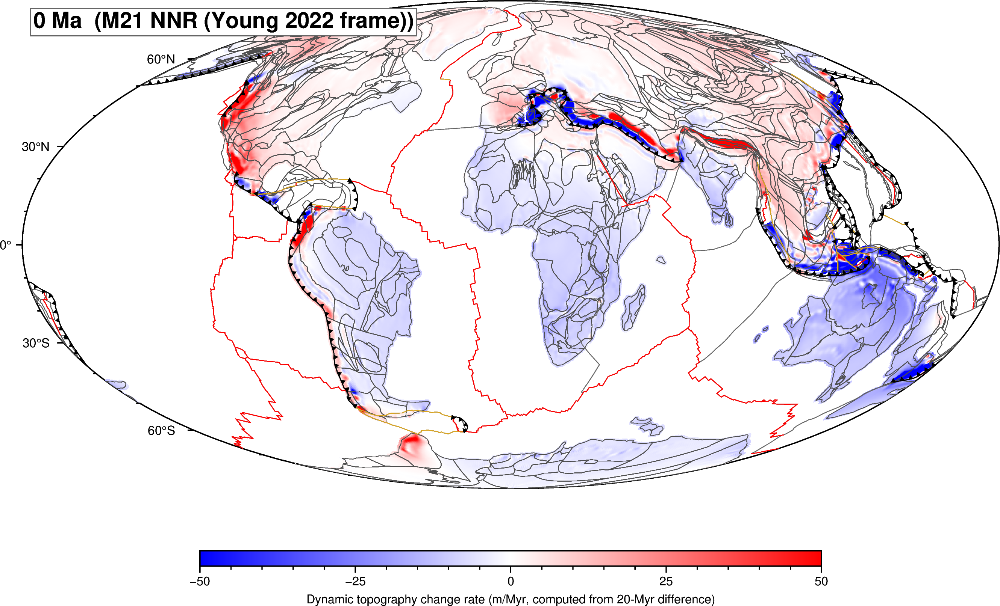

In [6]:
for age in SNAPSHOT_AGES:
    render_snapshot(float(age))

## What the figures show

Each panel paints the dyntopo *change* over the 20 Myr ending at the snapshot age. Red regions are where mantle flow was lifting the surface over that interval (upwelling drove uplift, or a subsiding signal eased); blue regions are where mantle flow was pulling the surface down (downwelling drove subsidence). White / pale regions saw little net change.

Several long-wavelength patterns recur:

- **Subduction-zone trains of subsidence (blue) on the upper plate** — slabs descending into the mantle pull the overriding plate down, visible as kilometre-scale subsidence over 20 Myr along most major active margins.
- **Patches of uplift (red) over mantle upwellings** — long-lived superplume regions (African LLSVP, Pacific LLSVP) leave persistent uplift signatures on the continents that drift across them.
- **Reversal of sign on collisional margins** — once subduction terminates in a continent-continent collision, the upper plate switches from dyntopo-driven subsidence to slab-rebound-driven uplift, visible as a sign flip in the same region across consecutive panels.

The 900 → 600 Ma panels cover the late Tonian → Cryogenian → Ediacaran assembly + breakup of Rodinia; 500 → 300 Ma cover the closing of Iapetus and the assembly of Pangaea; 200 → 0 Ma cover the breakup of Pangaea and the opening of the modern ocean basins.

## Extend this

- **Finer cadence.** Bundle additional Young 2022 keyframes (the full set is at 20-Myr cadence, 0–980 Ma; we ship only the 20 grids needed for the 10 default snapshots) and extend `SNAPSHOT_AGES` to e.g. every 40 or 20 Myr for a finer time-series. `STEP_MYR = 20` stays fixed because it's the keyframe cadence — set it to a multiple of 20 to use a wider differencing window.
- **Cumulative-from-present dyntopo.** Swap Δz(t) for the absolute past field `dyntopo(t)` cookie-cut + rotated — useful to compare against present-day dyntopo without the per-step differencing.
- **Alternative geodynamic model.** Re-run the same pipeline with the Braz et al. (2021) `gmcm9` grids (5-Myr cadence, 0–150 Ma) for a Phanerozoic sensitivity comparison.
- **Per-continent time-series.** For each continent's modern footprint, pull the per-step Δz time-series at every age and plot the basin-averaged dyntopo-rate evolution.
- **Couple to a paleo-DEM.** Add Δz(t) onto a reconstructed paleo-DEM (e.g. the Zhou-corrected Scotese-Wright topography from T44) to visualise where mantle flow is actively reshaping the surface at each frame on top of the deeper geological elevation signal. Note that the paleo-DEM's reference frame should match the simulation's NNR frame, or be re-rotated to it, to avoid spatial mismatch.

## References

- Young, A., Flament, N., Williams, S.E., Merdith, A., Cao, X. & Müller, R.D. (2022). Long-term Phanerozoic sea level change from solid Earth processes. *Earth and Planetary Science Letters* 584, 117451. https://doi.org/10.1016/j.epsl.2022.117451
- Müller, R.D., Flament, N., Cannon, J.S., Tetley, M.G., Williams, S.E., Cao, X., Bodur, Ö.F., Zahirovic, S. & Merdith, A. (2022). A tectonic-rules-based mantle reference frame since 1 billion years ago. *Solid Earth* 13, 1127–1159. (Closely related to but distinct from the M21 NNR frame used here.)
- EarthByte (2022). gld428 + M21 NNR dynamic-topography dataset. <https://www.earthbyte.org/webdav/ftp/Dynamic_Topography/gld428_m21/>
- Merdith, A.S. et al. (2021). Extending full-plate tectonic models into deep time. *Earth-Science Reviews* 214, 103477.
- Mather, B.R. et al. (2024). GPlately. *Geoscience Data Journal* 11, 3–10.
- Tian, D. et al. (2024). PyGMT. *Zenodo*. https://doi.org/10.5281/zenodo.13679420
- Wessel, P. et al. (2019). The Generic Mapping Tools version 6. *G3* 20, 5556–5564.
